# Building the Network

In [2]:
# Import libraries

import os
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import mpld3
from sklearn import model_selection, neighbors, naive_bayes, discriminant_analysis, svm, ensemble


mpld3.enable_notebook()

## Importing Data

We begin by importing the necessary data. Data was sourced from Facebook via the Facebook Graph API ([code here](https://github.com/wulucy/ncssm-networks/blob/master/Scraping%20FB.ipynb)) and manual collection.

In [3]:
def importData(filename):
    data = pd.read_csv(filename)
    return data

In [12]:
data = pd.read_csv('FBData.csv')
hall_attribute = pd.read_csv('HallAttribute.csv')
grade_attribute = pd.read_csv('GradeAttribute.csv')

**Data Notes**
* `FBdata.csv` is a dataframe of Facebook "connections" (likes on profile pictures) between students -- e.g. if s1 likes s0's profile picture, then s0 is the `sourcey` and s1 is the `targety`.
* `HallAttribute.csv` is a dataframe of the `hall` attribute; there is an entry for each student containing the student's ID and their hall.  
* `GradeAttribute.csv` is a dataframe of the `grade` attribute; there is an entry for each student containing the student's ID and their hall.

In [13]:
data.head()

,sourcey,targety
0,s0,s475
1,s0,s673
2,s0,s507
3,s0,s504
4,s0,s87


In [14]:
hall_attribute.head()

,node,value
0,s41,hall7
1,s618,hall3
2,s527,hall5
3,s609,hall5
4,s132,hall16


In [15]:
grade_attribute.head()

,node,value
0,s0,11
1,s1,12
2,s2,11
3,s3,12
4,s4,11


## Visualizing the Basic Graph

Using the `networkx` package, we build a basic visualization of the NCSSM students' Facebook graph. Each student is a node, and each Facebook connection is an edge.  

Since likes on profile pictures are inherently directed, we'll be using a directed graph.

In [16]:
# Build basic graph

def buildGraph(df, source, target):
    
    '''
    Builds graph.
    
    Parameters
    --------
    df : DataFrame 
        Dataframe containing nodes/edges data.
    source : str
        Name of column in df containing source nodes.
    target : str
        Name of column in df containing target nodes.
        
    Returns
    --------
    G : Graph
        Graph resulting from provided df.
    '''
    
    G = nx.DiGraph()
    G = nx.from_pandas_dataframe(
        df=data, source=source, target=target)
    return G

def plotGraph(graph, width, style, node_size):
    pos = nx.spring_layout(graph)
    nx.draw_networkx_edges(graph, pos, width=width, style=style)
    nx.draw_networkx_nodes(graph, pos, node_size=node_size)
    plt.show() # Note that this doesn't work offline!
    return None

In [17]:
G = buildGraph(data, 'sourcey', 'targety')

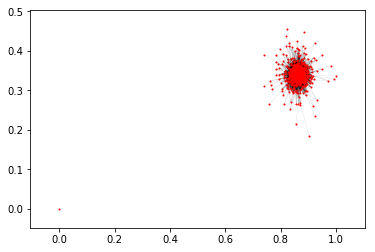

In [18]:
plotGraph(G, 0.05, 'solid', 1)

## Adding Node Attributes

Now we'll begin to add attributes to the nodes (i.e., characteristics to each student).

We'll add nodes via `nx.set_node_attributes`. In order to do so, we'll first convert the DataFrames containing the node attributes to dictionaries.

In [19]:
def dataframeToDict(df, nodenames='node'):
    
    '''
    Converts a DataFrame to a 
    dictionary of node attributes.
    
    Parameters
    ---------
    df : DataFrame
        Node attribute values, where 
        each entry is a node and its 
        corresponding attribute value.
    nodenames : str
        Name of column in df containing 
        nodes.
        
    Returns
    --------
    dictionary : dict
        Dictionary from df.
    '''
    
    dictionary = df.set_index(nodenames).to_dict()['value']
    return dictionary

In [20]:
def setNodeAttributes(graph, attribute, attribute_data):

    '''
    Sets an attribute for nodes 
    in a graph.
    
    Parameters
    --------
    graph : str
        Name of graph.
    attribute : str
        Name of attribute.
    attribute_data : dict
        Attribute value for each
        node.
    '''
    
    nx.set_node_attributes(graph, attribute, attribute_data)
    return None

In [21]:
# Set node attribute `hall`

hall_dict = dataframeToDict(hall_attribute)
setNodeAttributes(G, 'hall', hall_dict)

In [22]:
# Check that the attribute has been set

nx.get_node_attributes(G, 'hall')

{'s0': 'hall14',
 's1': 'hall0',
 's10': 'hall4',
 's100': 'hall14',
 's101': 'hall2',
 's102': 'hall1',
 's103': 'hall2',
 's104': 'hall6',
 's105': 'hall1',
 's106': 'hall8',
 's107': 'hall13',
 's108': 'hall7',
 's109': 'hall13',
 's11': 'hall14',
 's110': 'hall18',
 's111': 'hall11',
 's112': 'hall2',
 's113': 'hall2',
 's114': 'hall7',
 's115': 'hall16',
 's116': 'hall12',
 's117': 'hall9',
 's118': 'hall0',
 's119': 'hall5',
 's12': 'hall16',
 's120': 'hall15',
 's121': 'hall7',
 's122': 'hall11',
 's123': 'hall14',
 's124': 'hall9',
 's125': 'hall17',
 's126': 'hall3',
 's127': 'hall18',
 's128': 'hall10',
 's129': 'hall6',
 's13': 'hall13',
 's130': 'hall1',
 's131': 'hall7',
 's132': 'hall16',
 's133': 'hall17',
 's134': 'hall15',
 's135': 'hall17',
 's136': 'hall18',
 's137': 'hall1',
 's138': 'hall1',
 's139': 'hall17',
 's14': 'hall6',
 's140': 'hall15',
 's141': 'hall17',
 's142': 'hall18',
 's143': 'hall18',
 's144': 'hall18',
 's145': 'hall6',
 's146': 'hall4',
 's147': 

In [23]:
# Set node attribute `grade`

grade_dict = dataframeToDict(grade_attribute)
setNodeAttributes(G, 'grade', grade_dict)

In [24]:
# Check that the attribute has been set

nx.get_node_attributes(G, 'grade')

{'s0': 11,
 's1': 12,
 's10': 11,
 's100': 12,
 's101': 11,
 's102': 11,
 's103': 11,
 's104': 12,
 's105': 11,
 's106': 11,
 's107': 11,
 's108': 11,
 's109': 11,
 's11': 12,
 's110': 11,
 's111': 11,
 's112': 11,
 's113': 12,
 's114': 12,
 's115': 11,
 's116': 12,
 's117': 12,
 's118': 12,
 's119': 12,
 's12': 11,
 's120': 12,
 's121': 12,
 's122': 11,
 's123': 12,
 's124': 11,
 's125': 12,
 's126': 11,
 's127': 12,
 's128': 12,
 's129': 11,
 's13': 12,
 's130': 12,
 's131': 12,
 's132': 12,
 's133': 12,
 's134': 11,
 's135': 12,
 's136': 11,
 's137': 12,
 's138': 11,
 's139': 11,
 's14': 12,
 's140': 12,
 's141': 11,
 's142': 12,
 's143': 11,
 's144': 12,
 's145': 12,
 's146': 12,
 's147': 12,
 's148': 11,
 's149': 12,
 's15': 12,
 's150': 11,
 's151': 11,
 's152': 11,
 's153': 12,
 's154': 11,
 's155': 12,
 's156': 12,
 's157': 12,
 's158': 12,
 's159': 12,
 's16': 11,
 's160': 12,
 's161': 12,
 's162': 12,
 's163': 11,
 's164': 12,
 's165': 12,
 's166': 12,
 's167': 12,
 's168': 1

## Exploring Communities

We don't have any ground truth for communities, but we can sort nodes into communities based on well-known community detection algorithms. These algorithms generally only consider the structure of the graph rather than node attributes.

In this section, we will compare the structurally-determined communities with nodes' attributes in order to determine if node attributes (grade and hall) are related to the structural communities of the graph.

On face, this seems like it should be true -- students' halls and grade should play a major role in determining their friend circles.

(Note that we assume students belong to exactly one community for simplicity.)

**1. Computing Communities**

Using [python-louvain 0.3](https://pypi.python.org/pypi/python-louvain/0.3).

Louvain Modularity is purely structure-based (i.e., takes into account the way the nodes are connected, but not node attributes).

In [25]:
import community

In [26]:
# Computing communities
def computeCommunity(graph):
    parts = community.best_partition(graph)
    return parts

# Visualizing communities
def drawCommunities(graph, parts):
    values = [parts.get(node) for node in graph.nodes()]
    pos = nx.spring_layout(graph)
    nx.draw_networkx_edges(graph, pos, width=0.05, style='solid')
    nx.draw_networkx_nodes(graph,pos, node_size=1, node_color=values, cmap=plt.get_cmap('jet'))
    plt.show()
    return None

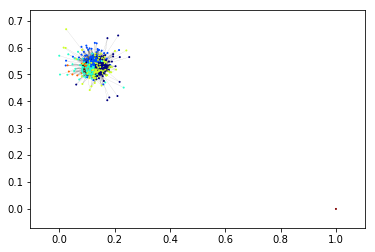

In [27]:
parts = computeCommunity(G)
drawCommunities(G, parts)

**2. Exploring Attributes vs. Louvain Communities**

In [131]:
def buildAttributeDF(df):
    df = pd.DataFrame.from_dict(parts, orient='index')
    
    #Merging attributes
    df = df.reset_index()
    df.columns = ['node', 'community']
    df = df.merge(grade_attribute, on='node')
    df = df.merge(hall_attribute, on='node')
    df.columns = ['node', 'community', 'grade', 'hall']
    
    #Converting hall + node columns to floats
    hall_list = df['hall'].tolist()
    hall_list = [x[4:] for x in hall_list]
    df['hall'] = hall_list
    node_list = df['node'].tolist()
    node_list = [x[1:] for x in node_list]
    df['node'] = node_list
    
    return df

In [132]:
parts_df = buildAttributeDF(parts_df)

In [133]:
parts_df.head()

,node,community,grade,hall
0,278,1,11,18
1,250,2,12,2
2,149,3,12,5
3,361,3,12,6
4,430,1,11,10


In [194]:
#Split into train/test sets

def TTsplit(df):
    X = df[['grade', 'hall']]
    y = df['community']
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.3, random_state=34)
    return X_train, X_test, y_train, y_test

In [209]:
X_train, X_test, y_train, y_test = TTsplit(parts_df)

Since this is a multiclass problem (as we have 6 different communities), we'll try a few classifiers suited for multiple classes.

In [199]:
def fitAndPredict(classifier, X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test, 
                bootstrap=True, getcoefs=False):
    print(str(classifier))
    mod = classifier
    if bootstrap==True:
        scores = []
        for i in range(100):
            mod.fit(X_train, y_train)
            scores += [mod.score(X_test, y_test)]
        print('Score:', np.mean(scores))
    if bootstrap==False:
        mod.fit(X_train, y_train)
        print('Score:', mod.score(X_test, y_test))
    if getcoefs==True:
        try:
            print('Feature weights:', mod.coef_)
        except AttributeError:
            print('Feature weights:', mod.feature_importances_)
    return None

In [200]:
# Fit K-nearest-neighbors and generate predictions
fitAndPredict(classifier=neighbors.KNeighborsClassifier(), bootstrap=False)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')
Score: 0.467980295567


In [201]:
# Fit GaussianNB and generate predictions

fitAndPredict(naive_bayes.GaussianNB(), bootstrap=False)

GaussianNB(priors=None)
Score: 0.349753694581


In [202]:
# Fit LDA and generate predictions

fitAndPredict(discriminant_analysis.LinearDiscriminantAnalysis(), getcoefs=True)

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
              solver='svd', store_covariance=False, tol=0.0001)


/Users/lucy/miniconda3/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:455: UserWarning: The priors do not sum to 1. Renormalizing
  UserWarning)


Score: 0.35960591133
Feature weights: [[ -1.73612458e+00   3.67554160e-02]
 [ -9.55651105e-01  -3.29792373e-02]
 [  1.44183836e+00  -9.15649253e-03]
 [  8.27621464e-01  -3.44404350e-04]
 [  7.57777900e-01   6.78537764e-02]
 [ -2.71727275e+00  -8.45713109e-02]]


In [204]:
# Fit Linear Support Vectors and generate predictions

fitAndPredict(svm.LinearSVC(), getcoefs=True)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
Score: 0.342660098522
Feature weights: [[ -3.73967379e-01   1.66178902e-02]
 [ -2.34318794e-01  -1.98459989e-02]
 [  2.83023450e-01   8.34062082e-03]
 [  2.31091797e-01  -2.69031110e-04]
 [  2.78652304e-03   7.46409039e-04]
 [ -8.88916540e-02  -1.84620202e-04]]


In [205]:
# Fit random forest and generate predictions

fitAndPredict(ensemble.RandomForestClassifier(), getcoefs=True)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)
Score: 0.500935960591
Feature weights: [ 0.20189339  0.79810661]


Note: Ordinarily, we would add more features to create a better model. While we do have additional relevant data, adding such features would risk violating the anonymity of the students in the dataset, so we will stop here.

**Model Analysis**

The feature weights for linear discriminant analysis and linear SVC generally indicate that grade is the more important attribute. Meanwhile, the feature weights for the random forest indicate that hall is significantly more important than grade.

In order to assess the accuracies of the models, we will generate randomized hall + grade data for all nodes and re-run the models with the randomized data to create a baseline accuracy for comparison.

In [221]:
def generateBaselineData(original_df):
    df_base = original_df.copy()

    grade_base = np.random.randint(low=11, high=13, size=len(original_df)).tolist()
    df_base['grade'] = grade_base

    hall_base = np.random.randint(low=0, high=19, size=len(original_df)).tolist()
    df_base['hall'] = hall_base
    
    X_train2, X_test2, y_train2, y_test2 = TTsplit(df_base)
    
    return X_train2, X_test2 # because y_train2 and y_test2 are unnecessary

In [223]:
X_train2, X_test2 = generateBaselineData(parts_df)

In [228]:
fitAndPredict(classifier=neighbors.KNeighborsClassifier(),
              X_train=X_train2, X_test=X_test2,
              bootstrap=False)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')
Score: 0.256157635468


In [226]:
fitAndPredict(classifier=naive_bayes.GaussianNB(),
              X_train=X_train2, X_test=X_test2,
              bootstrap=False)

GaussianNB(priors=None)
Score: 0.20197044335


In [230]:
fitAndPredict(discriminant_analysis.LinearDiscriminantAnalysis(), 
              X_train=X_train2, X_test=X_test2,
              bootstrap=False, getcoefs=True)

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
              solver='svd', store_covariance=False, tol=0.0001)
Score: 0.192118226601
Feature weights: [[-0.28554923 -0.00425898]
 [-0.16496089 -0.02338858]
 [ 0.36151814  0.01643734]
 [ 0.08882471  0.00831139]
 [-0.04099753  0.01709476]
 [-1.98909004 -0.14743946]]


/Users/lucy/miniconda3/lib/python3.5/site-packages/sklearn/discriminant_analysis.py:455: UserWarning: The priors do not sum to 1. Renormalizing
  UserWarning)


In [231]:
fitAndPredict(svm.LinearSVC(), 
              X_train=X_train2, X_test=X_test2,
              getcoefs=True)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
Score: 0.206009852217
Feature weights: [[-0.08402711 -0.01187747]
 [-0.07053706  0.00078467]
 [ 0.07329348  0.00155232]
 [ 0.03735199 -0.00655837]
 [-0.02957004  0.00078408]
 [-0.0884332  -0.00110557]]


In [232]:
fitAndPredict(ensemble.RandomForestClassifier(), 
              X_train=X_train2, X_test=X_test2,
              getcoefs=True)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)
Score: 0.218374384236
Feature weights: [ 0.10034204  0.89965796]


All 5 models returned roughly the same accuracy, with significant decreases in accuracy compared to the non-randomized training sets.

Final results are summarized in the following table.

| Classifier                   | Baseline Accuracy | Accuracy |
|------------------------------|-------------------|----------|
| K nearest neighbors          | 0.2561            | 0.4679   |
| Gaussian Naïve Bayes         | 0.2019            | 0.3497   |
| Linear Discriminant Analysis | 0.1921            | 0.3596   |
| Linear Support Vector        | 0.2060            | 0.3426   |
| Random Forest                | 0.2183            | 0.5009   |

* to-do: add Girvan-Newman community detection from [kjahan](https://github.com/kjahan/community/issues/1)? need to fork + rewrite to implement on existing NetworkX graph

In [65]:
## Unfinished Girvan-Newman stuff
'''
A = nx.adj_matrix(G)

n = G.number_of_nodes()
m_ = 0.0    #the weighted version for number of edges
for i in range(0,n):
    for j in range(0,n):
        m_ += A[i,j]
m_ = m_/2.0

Orig_deg = UpdateDeg(A, G.nodes())
runGirvanNewman(G, Orig_deg, m_)
'''